start of a swimmers plot script for the cardiac amyloidosis and multiple myeloma data

you will need to plot the data for multiple patients... this may result in some complex loops
what will you do to remove the zero data from the plots? 
how to accomodate that not all patients have the same time points? 

add patient amyloid status and Dx from the cardiac oncology sheet to each patient... 

In [29]:
import missingno as msno
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.patches as mpatches

# Define the path to the folder
folder_path = 'C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/PatientLabs-Logial-Ordersets_2024-05-31-v5'

# List all files in the folder
file_names_list = os.listdir(folder_path)

startfile_ending = '.xlsx' #the file ending for the raw data
startfile_common = 'ordersets' #the suffix for the output data file including file extension
#sheet names
labs_sheet = 'labs' #sheet name for the original patient labs data
ptLogicalIn_sheet = 'logical' #sheet name for the binary logical data for a patient
ordersets_bin_sheet = 'ordersets-bin' #sheet title for the order sets in binary
ordersets_ranked_sheet = 'ordersets-ranked' #sheet name for the data indicating level of completeness of the orderset
labs_binary_sheet = "binary"
labs_binary_sum_sheet = "binary-sum"



In [12]:
#this contains the information for a patient class
#creates a class for patients so we can call information about them easily
class patient:
    def __init__(self, filepath, input_fileName, lengthPtID):
        ptID = input_fileName[:lengthPtID]
        self.ptID = ptID
        self.fileName = input_fileName
        #find the demographics in one of two sheets
        # directory = os.getcwd()
        file_adds = filepath + '/' + input_fileName
        file = pd.ExcelFile(file_adds)
        sheet_Names = file.sheet_names
        if 'Cancer_Registery Data' in sheet_Names:
            #do the thing for getting patient info
            df = pd.read_excel(input_fileName, sheet_name= 'Cancer_Registery Data')
            self.ptDemographics = df
            self.amyloid_status = df.at[0,"Amyloid Status"]
            self.survival = df.at[0,"Survival Time (Months)"]
            self.ageDx = df.at[0,"Age At Diagnosis"] 
            self.sex = df.at[0,"Gender Cancer Registry"]
            self.vitalStatus = df.at[0, "Vital Status Cancer Registry"]
            self.dx = df.at[0, "Histology"]

        elif '30 Cerner Patients ' in sheet_Names:
            #do the thing for getting patient info
            df = pd.read_excel(input_fileName, sheet_name= '30 Cerner Patients ')
            self.ptDemographics = df
            self.amyloid_status = df.at[0,"Amyloid Status"]
            self.survival = df.at[0,"Survival Time (months)"]
            self.ageDx = df.at[0,"Age At Diagnosis"] 
            self.sex = df.at[0,"Gender Cerner"]
            self.vitalStatus = df.at[0, "Vital Status (Cerner)"]
            self.dx = df.at[0, "Primary Site"]


        else: print("no patient identifying information")

        #now iterate through the list of sheets to import the patient data 
        if 'Labs' in sheet_Names:
            self.labsData = pd.read_excel(input_fileName, sheet_name= 'Labs')
        else: self.labsData = False
        
        if 'amyloid in subject' in sheet_Names:
            self.echoData = pd.read_excel(input_fileName, sheet_name= 'amyloid in subject')
        else: self.echoData = False

        if 'ChemoTx' in sheet_Names:
            self.ChemoTx = pd.read_excel(input_fileName, sheet_name= 'ChemoTx')
        else: self.ChemoTx = False

        if 'Hematologic Tx' in sheet_Names:
            self.HemeTx = pd.read_excel(input_fileName, sheet_name= 'Hematologic Tx')
        else: self.HemeTx = False

        if 'Immuno Tx' in sheet_Names:
            self.HemeTx = pd.read_excel(input_fileName, sheet_name= 'Immuno Tx')
        else: self.ImmunoTx = False

        if 'Radiation Tx' in sheet_Names:
            self.RadTx = pd.read_excel(input_fileName, sheet_name= 'Radiation Tx')
        else: self.ImmunoTx = False

        if 'Physican_Notes' in sheet_Names:
            self.MDnotes = pd.read_excel(input_fileName, sheet_name= 'Physican_Notes')
        else: self.MDnotes = False

        #to create a callable list of treatments recieved for which we have data
        tx_sheets = ['ChemoTx', 'Hematologic Tx', 'Immuno Tx']
        treatmentTypesRecieved = []

        for possible in tx_sheets:
        
            if possible in sheet_Names:
                treatmentTypesRecieved.append(possible)
        self.txRecieved = treatmentTypesRecieved

def FilterList(list, keyWords_primary, keyWords_secondary = ["Empty"], omit = ["Empty"]):
    #store the filtered result
    filteredList = []

    if keyWords_secondary == ["Empty"]:
        for c in list: #loop the columns
            for buzz in keyWords_primary: #loop the key words
                if buzz in c: #if the column contains the key word
                    filteredList.append(c) #add the column to the list
                    break #do not continue testing primary key words for this column
    
    else: 
        for c in list: #loop the columns
            for buzz in keyWords_primary: #loop the key words
                if buzz in c: #if the column contains the key word
                    for secondary in keyWords_secondary:
                        if secondary in c:
                            filteredList.append(c) #add the column to the list
                            break #has been added to list based on passing the seondary 
                        else:
                            pass
                    break #do not continue to check primary key words for this column
                else:
                    pass

    # #old code incase the breaks make a mess                    
    # if keyWords_secondary == ["Empty"]:
    #     for c in list: #loop the columns
    #         for buzz in keyWords_primary: #loop the key words
    #             if buzz in c: #if the column contains the key word
    #                 filteredList.append(c) #add the column to the list

    
    # else: 
    #     for c in list: #loop the columns
    #         for buzz in keyWords_primary: #loop the key words
    #             if buzz in c: #if the column contains the key word
    #                 for secondary in keyWords_secondary:
    #                     if secondary in c:
    #                         filteredList.append(c) #add the column to the list
         
    # if omit != ["Empty"]: 
    #     for a in filteredList:
    #         for x in omit:
    #             if x in a:
    #                 filteredList.remove(a)
    if omit != ["Empty"]: 
        for x in omit: 
            for a in filteredList:
                if x in a:
                    filteredList.remove(a)
    
    #by iterating through the column names first, we keep the order of the columns

    return filteredList 

#createBinary function
def createBinary(df, listOfLabs, timeColumn): 
    #list of labs needs to match exactly.  
    # Filter the dataframe before inputting
    #for boolean
    df_toBool = df[listOfLabs]
    df_bool = df_toBool.notna()
    df_asint = df_bool.astype(int)
    #add column back for time 
    df_asint.insert(0, timeColumn, df[timeColumn])
    return df_asint

def createBinarySum(df, listOfLabs, timeColumn):
    #list of labs needs to match exactly.  
    # Filter the dataframe before inputting
    #for boolean
    df_toBool = df[listOfLabs]
    df_bool = df_toBool.notna()
    df_asint = df_bool.astype(int)
    #add column back for time 
    df_asint.insert(0, timeColumn, df[timeColumn])
    #sum across the row
    df_new_sum = df_asint.sum(axis = 1)
    return df_new_sum

#get list of patients from directory 
def GetListOfPatientsFromDirectory (directory, fileExtension, fileCommon, lengthID):
    #get the directory 
    listFileNames = os.listdir(directory)
    outputList = []
    #loop through list of fileNames: 
    for file in listFileNames:
        #id if the file is patient data
        if fileCommon in file and file.endswith(fileExtension):
            #trim the file name to the pt ID
            ptID = file[:lengthID]
            outputList.append(ptID)
    return outputList

def GetListofPTfiles(directory, fileExtension, fileCommon):
    listFileNames = os.listdir(directory)
    outListFiles = []
    #loop through file names
    for file in listFileNames:
        if fileCommon in file and file.endswith(fileExtension):
            outListFiles.append(file)
    return outListFiles


directories

In [13]:
#directory
starting_directory = os.getcwd()

new_dirrectory = 'C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/data-2024-06-05'
os.chdir(new_dirrectory)

importing patient data from a folder to dictionaries

In [15]:
#importing patient data as dictionaries
#importing patient data to pd
ptID_test = "E-01"

#build a dictionary of patients and their values 
ptFiles = GetListofPTfiles(new_dirrectory, '.xlsx', 'data')

patientDictAmyloid = {}
patientDictSurvival = {}
patientDictLabs = {}
patientDictEcho = {}
patientDictNotes = {}
patientDictDx = {}
patientDictVitalStatus = {}

#loop through the listOfPatients 
for file in ptFiles: 
    pt = patient(new_dirrectory, file, 4)
    patientDictAmyloid[pt.ptID] = pt.amyloid_status
    patientDictSurvival[pt.ptID] = pt.survival
    patientDictLabs[pt.ptID] = pt.labsData
    patientDictEcho[pt.ptID] = pt.echoData
    patientDictNotes[pt.ptID] = pt.MDnotes
    patientDictDx[pt.ptID] = pt.dx
    patientDictVitalStatus[pt.ptID] = pt.vitalStatus
    

#calling patient to test 
ptLabsTest = patientDictLabs[ptID_test]

In [38]:
#checking to see how some of the data outputs
print("type of output for patientDictVitalStatus[key]: ", type(patientDictVitalStatus["E-01"]))
ptID_test = 'A-02'
if ["multiple myeloma"] or ["MM"] in patientDictDx[ptID_test]:
    print("Patient has multiple myeloma: ", patientDictDx[ptID_test])
elif ["MGUS"] in patientDictDx[ptID_test]:
    print("Patient has MGUS: ", patientDictDx[ptID_test])
else: 
    print("Patient dx other: ", patientDictDx[ptID_test])

type of output for patientDictVitalStatus[key]:  <class 'str'>
Patient has multiple myeloma:  MGUS/amyloid


labs key words and dictionaries

In [5]:
#keywords by group
kwPrimary_bloodGeneral = ["Hemoglobin","Platelet Count", "INR","WBC", "Blast","Coombs", "Immature Gran", "Monocyte", "Neutrophil", "RBC"]
kwPrimary_LightChains =["LDH","Beta-2", "Kappa Free Light Chains", "Lambda Free Light Chains", "Free Light Chain Ratio"]
kwPrimary_SerumElectrophoresis = ["Serum Electrophoresis", "Serum Immunologic"]
kwPrimary_metabolic = ["BUN", "Creatinine Result","Uric Acid","Albumin Result","Serum Protein"]
kwPrimary_Urine = ["Total Urine Protein", "Urine Albumin", "Urinalysis Alpha1", "Urinalysis Alpha2",
                    "Urinaysis Beta Globulin", "Urinalysis Gamma Golubulin", "Urinalysis M Spike",
                    "Urine Osmolality", "Urine Specific Gravity"]
kwPrimary_Cardiac = ["BNP","Troponin-T"]

#all key words
keywords_Primary = ["BUN", "Albumin Result", "Creatinine Result",
                    "Hemoglobin", "Platelet Count", "INR", "Kappa Free Light Chains",
                    "Lambda Free Light Chains", "Free Light Chain Ratio",
                    "Total Urine Protein", "Urine Albumin", "Urinalysis Alpha1", "Urinalysis Alpha2",
                    "Urinaysis Beta Globulin", "Urinalysis Gamma Golubulin", "Urinalysis M Spike", "BNP",
                    "Troponin-T", "Beta-2", "LDH", "Uric Acid", "Serum Protein", "WBC", "Blast",
                    "Coombs", "Immature Gran", "Monocyte", "Neutrophil", "RBC", "Serum Electrophoresis",
                    "Serum Immunologic", "Urine Osmolality", "Urine Specific Gravity"]

In [6]:
ordersets_dict = {
    "CBC with Coag" : ["Hemoglobin","Platelet Count", "INR","WBC", "Blast","Coombs", 
                       "Immature Gran", "Monocyte", "Neutrophil", "RBC"],
    "Light Chains" : ["Beta-2", "Kappa Free Light Chains", "Lambda Free Light Chains", 
                      "Free Light Chain Ratio"],
    "Serum Electrophoresis" : ["Serum Electrophoresis", "Serum Immunologic"],
    "CMP with LDH" : ["BUN", "Creatinine Result","Uric Acid","Albumin Result","Serum Protein", "LDH"],
    "Urinalysis" : ["Total Urine Protein", "Urine Albumin", "Urinalysis Alpha1", "Urinalysis Alpha2",
                        "Urinaysis Beta Globulin", "Urinalysis Gamma Golubulin", "Urinalysis M Spike",
                        "Urine Osmolality", "Urine Specific Gravity"],
    "Cardiac Labs" : ["BNP","Troponin-T"],
    "Serum-Urine-LightChains" : ["Serum Electrophoresis", "Serum Immunologic","Total Urine Protein", 
                                 "Urine Albumin", "Urinalysis Alpha1", "Urinalysis Alpha2",
                                 "Urinaysis Beta Globulin", "Urinalysis Gamma Golubulin", "Urinalysis M Spike",
                                 "Urine Osmolality", "Urine Specific Gravity", "Beta-2", 
                                 "Kappa Free Light Chains", "Lambda Free Light Chains", "Free Light Chain Ratio"]
} 

ordersets_secondary = {
    "CBC with Coag" : ["Result"],
    "Light Chains" : ["Result"],
    "Serum Electrophoresis" : ["Result"],
    "CMP with LDH" : ["Result"],
    "Urinalysis" : ["Result"],
    "Cardiac Labs" : ["Empty"],
    "Serum-Urine-LightChains" : ["Result"]
}

ordersets_omit = {
    "CBC with Coag" : ["Urinalysis", "Method", "Nucleated RBC/100 WBC Result Method"],
    "Light Chains" : ["Method"],
    "Serum Electrophoresis" : ["Method"],
    "CMP with LDH" : ["Method"],
    "Urinalysis" : ["Method"],
    "Cardiac Labs" : ["Empty"],
    "Serum-Urine-LightChains" : ["Method"]
}

sorting patients by amyloid status

In [7]:
#get amyloid status dictionary inputs, sort ptIDs to lists based on amyloid status 
def getListSortedByAmyloid(amyloidDictionary, listPositive, listNegative, listOther,
                           statusPositive = "yes", statusNegative = "no"):
    for pt in amyloidDictionary.keys():
        status = amyloidDictionary[pt]
        if status == statusPositive:
            listPositive.append(pt)
        elif status == statusNegative:
            listNegative.append(pt)
        else:
            listOther.append(pt)
    #does not check for double listed patient IDs
#use this list to help pick patient IDs for plotting

#testing this function
listPositive = []
listNegative = []
listOther = []
getListSortedByAmyloid(patientDictAmyloid, listPositive= listPositive, listNegative= listNegative,
                       listOther=listOther)

create binary data for plotting patients starting with patient lab sheets

In [11]:
dictOfFilteredLabs = {}
dictOfNormalRanges = {}
dictOfBinaryLabs = {}

for pt in patientDictLabs.keys():
        
    ptLabs = patientDictLabs[pt]

    orig_columns = ptLabs.columns

    #filter the patient labs
    columnNames = FilterList(orig_columns, keyWords_primary = keywords_Primary, keyWords_secondary=['Result'], 
                             omit = ['Method','Nucleated', '100'])
    keywords_Primary_2 = ["Troponin-T", "BNP", ]
    columnNames2 = FilterList(orig_columns, keyWords_primary = keywords_Primary_2)
    columnNames.extend(columnNames2)
    testNames = ["RelTime(Days)"]
    testNames.extend(columnNames) #addition of time label

    ptLabs_results= ptLabs[testNames] #new data frame of just results
    
    #troponin contains strings which mess up plotting 
    df_ptLabs_results_2 = ptLabs_results
    for col in columnNames:
        df_ptLabs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
    ptLabs_results_2 = df_ptLabs_results_2
    dictOfFilteredLabs[pt] = ptLabs_results_2

    #get the normal values and plot those in another color on the same graph as the patient values
    #filtering the patient labs dataframe for the columns containing normal values
    columnNames_ranges = FilterList(orig_columns, keyWords_primary= keywords_Primary,
                                    keyWords_secondary= ["Limit"])
    ptLabs_ranges = ptLabs[columnNames_ranges] #ranges does not include time here
    dictOfNormalRanges[pt] = ptLabs_ranges
    #when plotting ranges, include time from the other dataset 

    #create binary
    #use the raw labs or the filtered labs, the column names must already match
    binaryLabs = createBinary(ptLabs_results_2, columnNames, "RelTime(Days)")
    dictOfBinaryLabs[pt] = binaryLabs

C:\Users\maega\AppData\Local\Temp\ipykernel_58764\2567302197.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ptLabs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\2567302197.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ptLabs_results_2[col] = ptLabs_results[col].apply(lambda x: 0 if isinstance(x, str) else x)
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\2567302197.py:23: SettingWithCopyWarning: 
A

In [9]:
#plotting the binary data 
# labToPlot = "BUN Result(mg/dL)"
# timeColumn = "RelTime(Days)"
# fig, ax=plt.subplots()
# plt.scatter(binaryLabs["RelTime(Days)"], binaryLabs[labToPlot])

# fig, ax2=plt.subplots()
# plt.plot(ptLabs_results["RelTime(Days)"], ptLabs_results[labToPlot])

#create binary
# outfile_common = 'data'
# binaryLabsSheet = 'binary labs'
# for pt in patientDictLabs.keys():
#     #use the raw labs or the filtered labs, the column names must already match
#     binaryLabs = createBinary(ptLabs, columnNames, timeColumn=timeColumn)
    #saving the binary labs to a sheet?

#     outfile = pt + '-' + outfile_common + '.xlsx'
#     #saving if new file
#     outfile_path = new_dirrectory + '/'+ outfile #outfile path

#     #check to see if there is output data 
#     output = isinstance(binaryLabs, pd.DataFrame)
    
#     if output == True: #print results to a file
#             if os.path.exists(outfile_path):
#                 #if old sheet
#                 with pd.ExcelWriter(outfile, mode = 'a', if_sheet_exists = 'overlay') as writer:
#                         binaryLabs.to_excel(writer, sheet_name = binaryLabsSheet, index = True)
#             else: 
#                 #new sheet
#                 with pd.ExcelWriter(outfile) as writer:
#                         binaryLabs.to_excel(writer, sheet_name = binaryLabsSheet, index = True) #if new sheet
#     else: #no dataframe, no data
#             pass

dictionary of echo dates for all patients

In [18]:
EchoTimeColumn ='time from diagnosis to first echo (months)'
echoDates = {}
for pt in patientDictEcho:
    ptEchoData = patientDictEcho[pt]
    patientEchoDate = ptEchoData[EchoTimeColumn]
    if 'none' not in list(patientEchoDate):
        echoDates[pt] = patientEchoDate

lab results per patient

In [12]:
#single patient
#plotting binary data for all patients gainst time
dateTag = "_2024-06-13"
#make dirrectory for saving files 
parent_dir = new_dirrectory
folderName = "LabResultsPlot" + dateTag
path = os.path.join(parent_dir,folderName)
os.mkdir(path)



name of range column:  BUN Upper Limit of Normal
name of range column:  Hemoglobin Lower Limit of Normal
name of range column:  Hemoglobin Upper Limit of Normal
name of range column:  Platelet Count Lower Limit of Normal
name of range column:  INR Lower Limit of Normal
name of range column:  Beta-2-Microglobulin Lower Limit of Normal
name of range column:  Beta-2-Microglobulin Upper Limit of Normal
name of range column:  Uric Acid Lower Limit of Normal
name of range column:  Uric Acid Upper Limit of Normal


C:\Users\maega\AppData\Local\Temp\ipykernel_41456\3536404887.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax=plt.subplots()


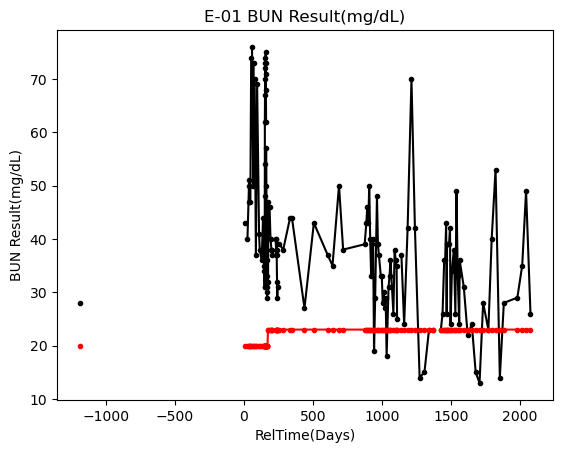

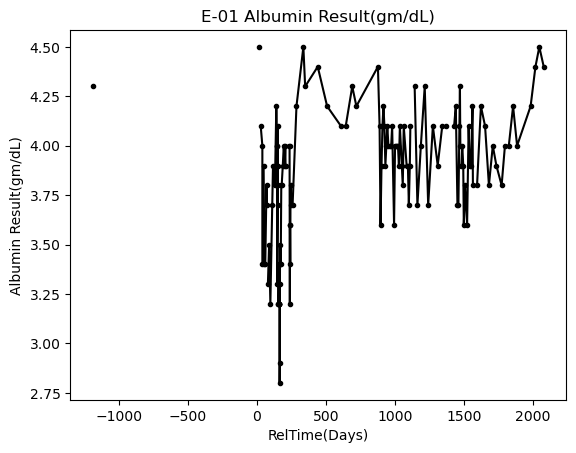

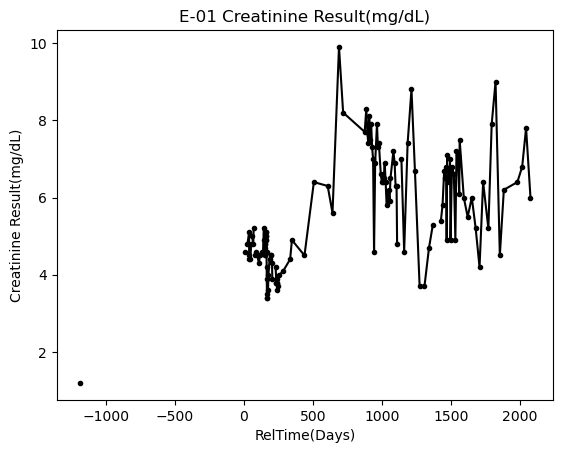

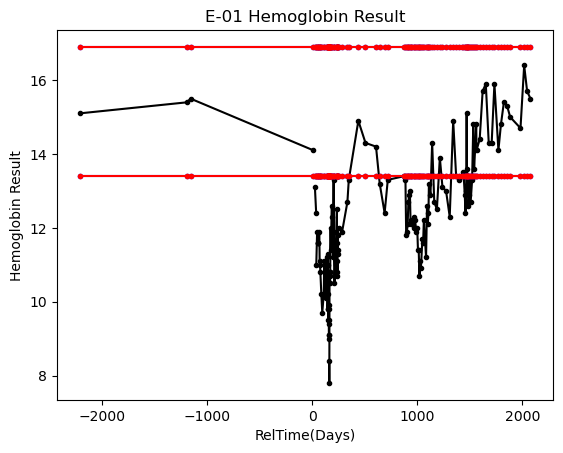

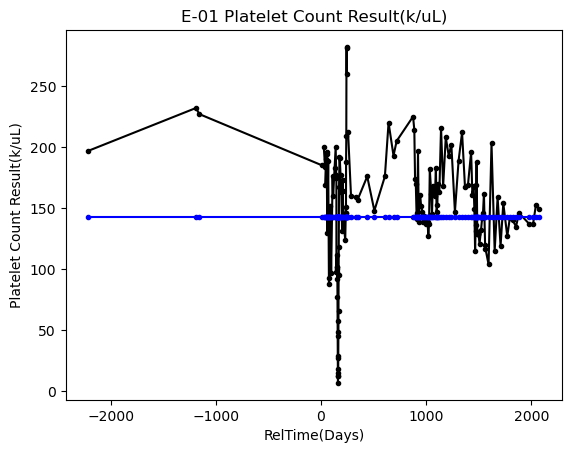

...

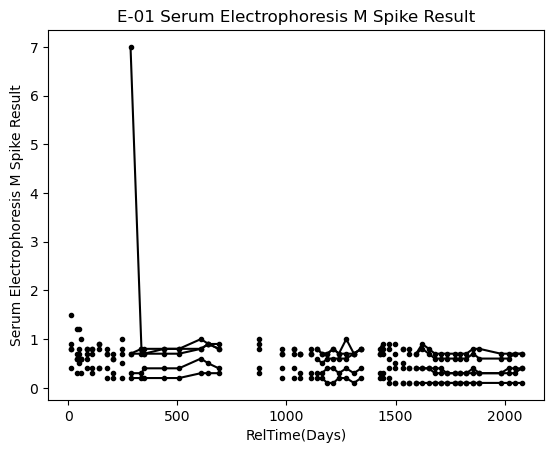

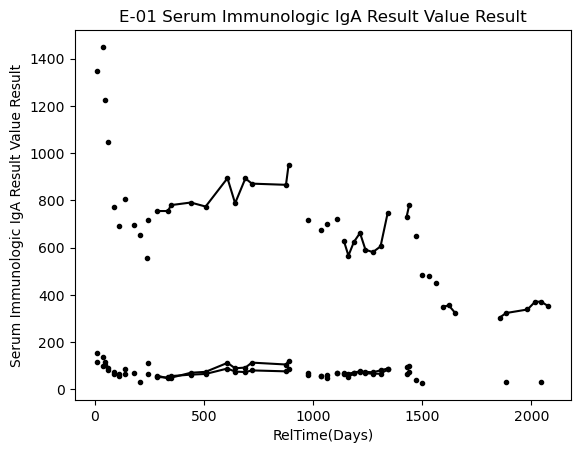

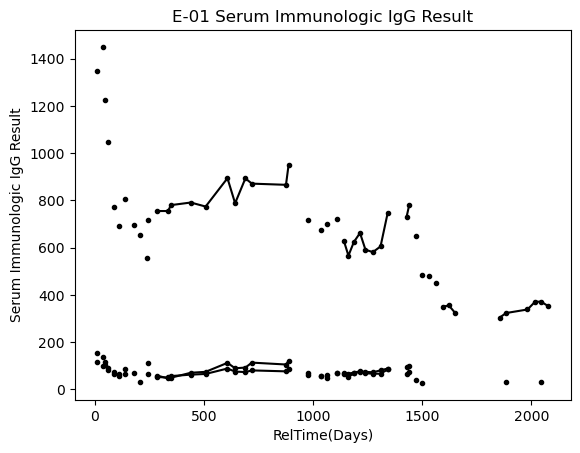

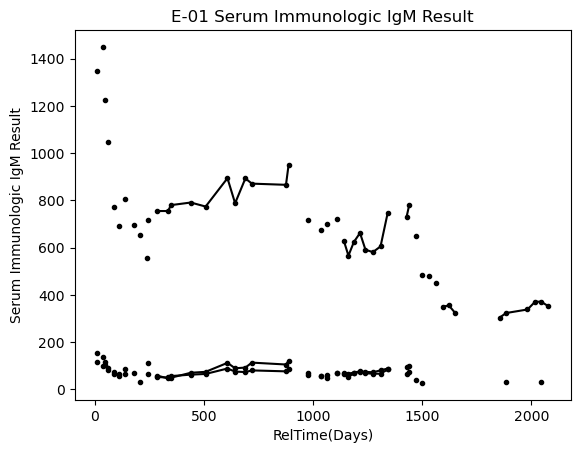

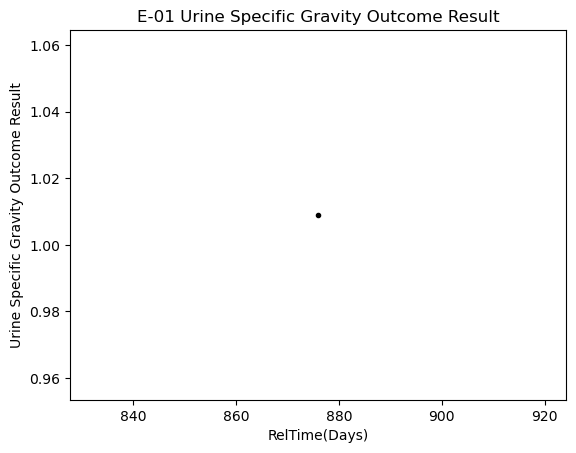

In [15]:
ptLabs_results_2 = dictOfFilteredLabs[ptID_test]
ptLabs_ranges =dictOfNormalRanges[ptID_test]
# ploting patient lab values and normal ranges
timeColumn = "RelTime(Days)"
#call the normal range data corresponding with the plotted data

for keyword in keywords_Primary:
    keyword = [keyword]
    #fetch the appropriate columns
    dataColumn = FilterList(columnNames, keyWords_primary= keyword)
    rangeColumn = FilterList(columnNames_ranges, keyWords_primary= keyword)
    if len(dataColumn) >= 1:
        #iterate through the dataColumn list
        # fig, ax=plt.subplots() 
        for col in dataColumn:
            #check the amount of data for that column 
            #find the amount of data in the column
            testColumn = ptLabs_results_2[col]
            testnumber = testColumn.dropna()
            testlengthofdata = len(testnumber)
            if testlengthofdata > 0:
                #generate the figure and axis here so that it is dependent upon data existing
                fig, ax=plt.subplots() 
                #plot the data
                plt.plot(ptLabs_results_2[timeColumn], ptLabs_results_2[dataColumn], color = 'black',
                         marker =".")
                ax.set_title(ptID_test + " "+ col)
                ax.set_ylabel(col)
                ax.set_xlabel(timeColumn)
                #check to see if there is range 
                if len(rangeColumn) > 0:
                    #plot each relevant range using for loop
                    # print("length of rangeColumn: ", len(rangeColumn))
                    for col in rangeColumn:
                        print("name of range column: ", col)
                        s = col.split()
                        if "Upper" in s:
                            plt.plot(ptLabs_results_2[timeColumn], ptLabs_ranges[rangeColumn], color = 'red', marker = '.')
                        elif "Lower" in s:
                            plt.plot(ptLabs_results_2[timeColumn], ptLabs_ranges[rangeColumn], color = 'blue', marker = '.')
                        else:
                            plt.plot(ptLabs_results_2[timeColumn], ptLabs_ranges[rangeColumn], color = 'green', marker = '.')
                    #saving the image
                    # labdescriptor = dataColumn.strip(",.!@#$%^&*()")
                else:
                    # print("no range column found with keyword: ", keyword)
                    pass
                labdescriptor = str(col)
                labdescriptor = labdescriptor.replace("/", "-")
                out_filename = ptID_test + '-' + labdescriptor + '-labs' +dateTag + '.tif'
                new_filepath = os.path.join(path,out_filename)
                plt.savefig(new_filepath, bbox_inches = 'tight')
                # ax.legend()
    else:
        #no range given
        # print("No data for key word: ", keyword)
        pass

    

In [11]:
orig_columns_list = list(patientDictLabs['E-01'].columns)

swimmer plots draft

In [19]:
#plotting binary data for all patients gainst time
dateTag = "_2024-06-14"
#make dirrectory for saving files 
parent_dir = new_dirrectory
folderName = "singleLab-Swimmers" + dateTag
path = os.path.join(parent_dir,folderName)
os.mkdir(path)


swimmers for amyloid positive patients by lab

C:\Users\maega\AppData\Local\Temp\ipykernel_58764\1503285776.py:94: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\1503285776.py:94: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\1503285776.py:94: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\1503285776.py:94: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in t

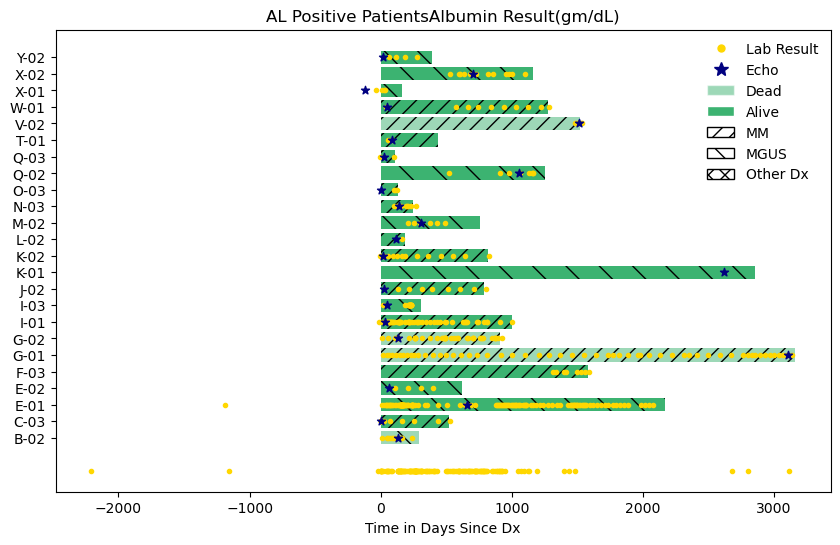

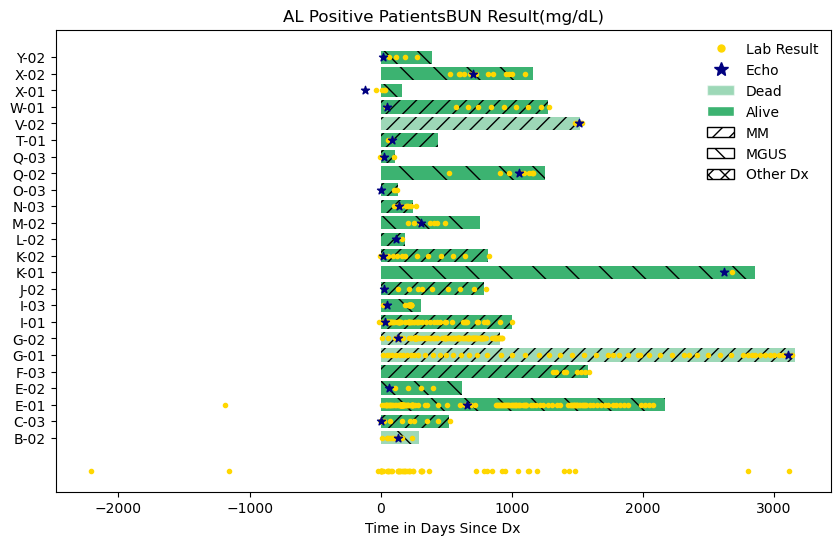

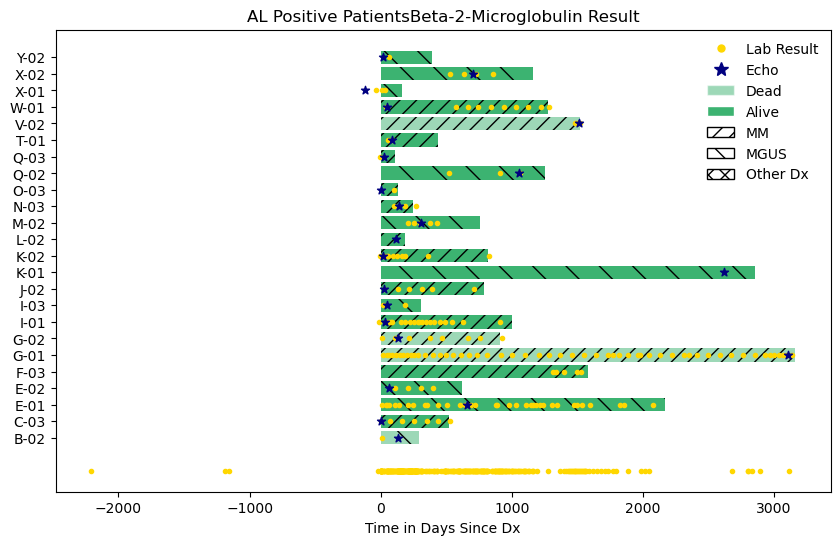

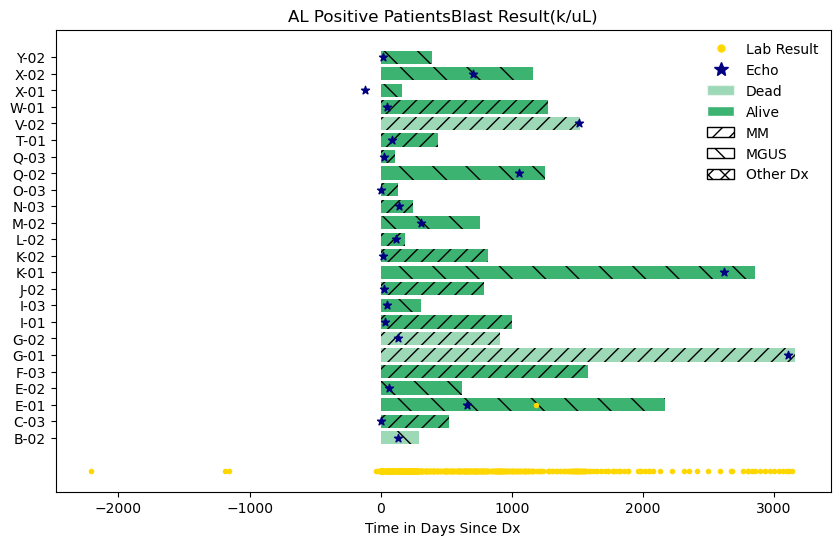

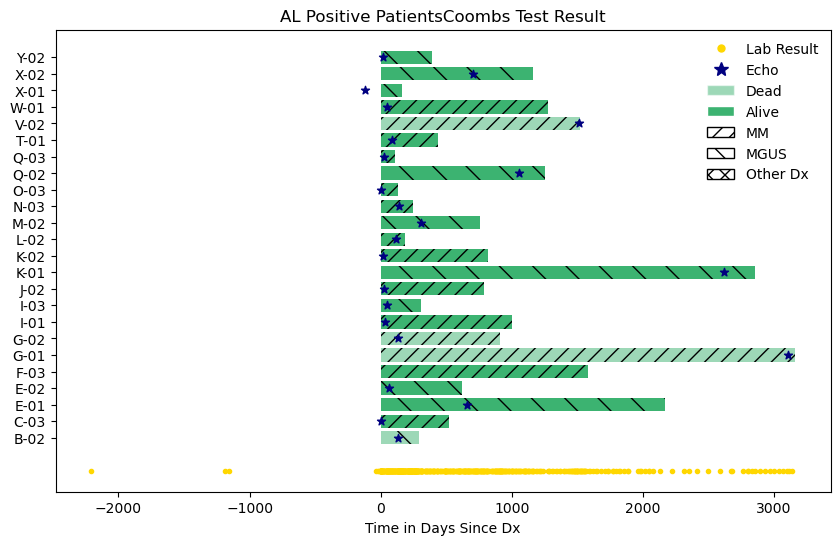

...

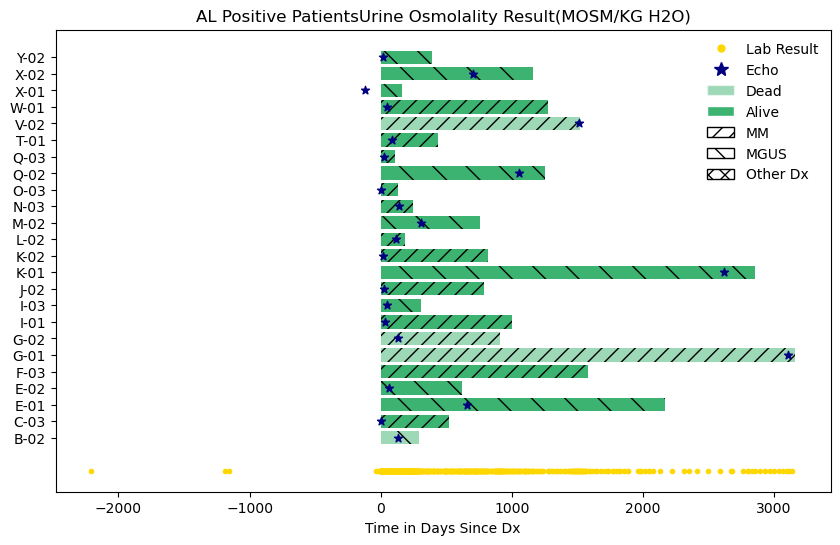

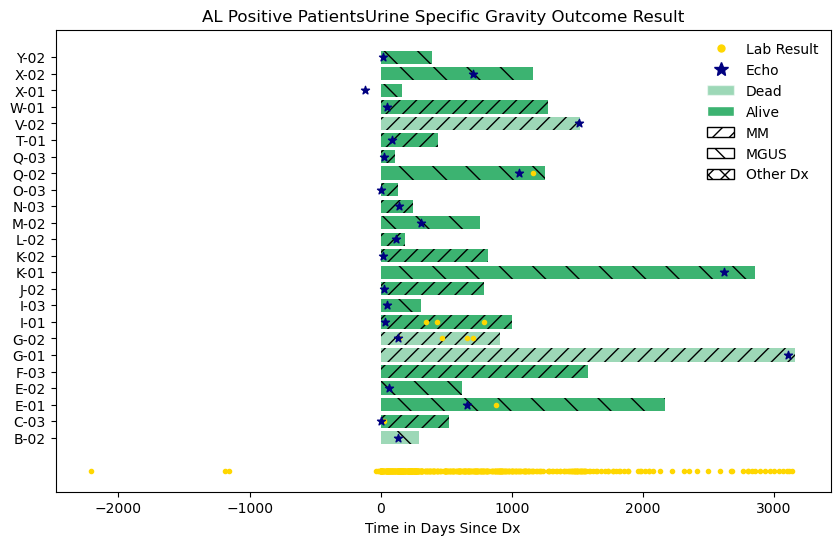

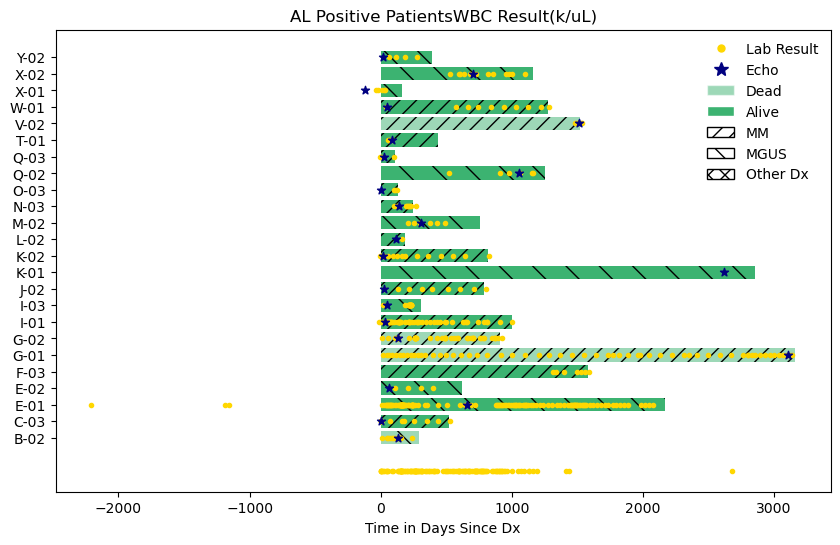

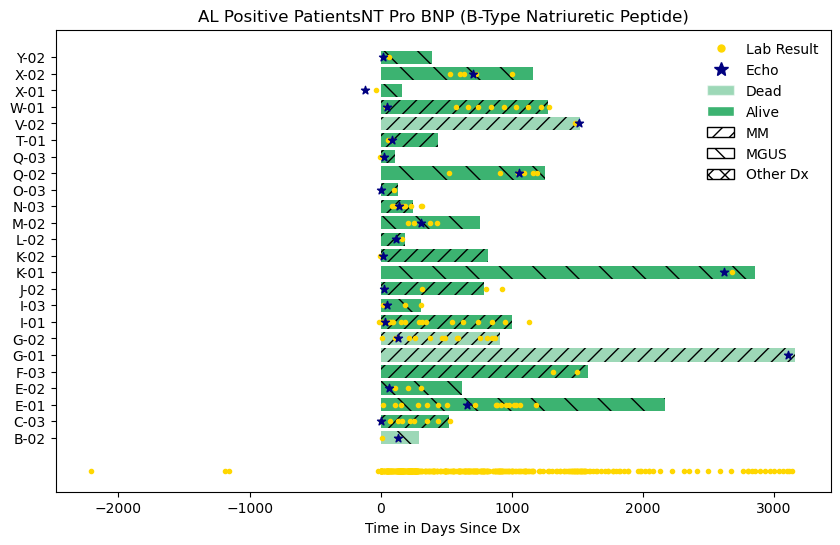

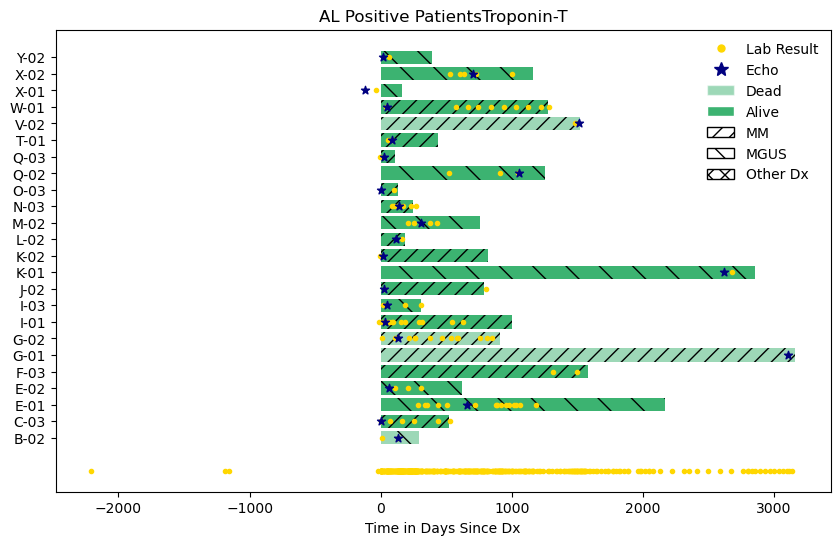

In [44]:
#takes information from a series of dictionaries to create swimmer plots
#echoDates{} --> prefiltered when created to remove non number results
#dictOfBinaryLabs{} --> binaries calculated for the columns of interest
# dictOfFilteredLabs{} --> only columns of interest
#currently set up for amyloid positive patients

timeColumn = 'RelTime(Days)'
EchoTimeColumn ='time from diagnosis to first echo (months)'
ptList = listPositive #list of patients you want to plot

#output file information
outfileStart = "AL-Positive"
outfileEnding = "-swimmer"
figureTitleCommon = "AL Positive Patients"
xLabel = "Time in Days Since Dx"
#path = path to folder where you want the information saved

#figure information
figuresize = (10,6)
barcolor = 'mediumseagreen'
labcolor = 'gold'
echoColor = 'navy'
labmarker = '.'
echomarker = '*'
step_size = 0.5 
heightbars = 0.4
alpha_Dead = 0.5
alpha_Alive = 1
hatch_MM = '//'
hatch_MGUS = '\\'
hatch_other = 'xx'

#some other definitions to help with reading this code
# echoDates = echoDates #dictionary of patient IDs and echo dates retreived from patient data
# dictOfFilteredLabs = dictionary of patient labs filtered for columns of interest.
# dictOfNormalRanges = dictionary of normal ranges for patient labs by time in days
# dictOfBinaryLabs = dictionary of patient labs by ID of patient labs as binary over time
# patientDictSurvival = dictionary of patient IDs and survival in months 

for labofinterest in columnNames:
    #collecting patient IDs for y axis 
    y_pt_ids = {}
    i=1

    fig, ax = plt.subplots(figsize=figuresize)
    increment = i
    for pt_ID in ptList: 
        #collecting the patient IDs to make a label for the y axis
        y_pt_ids.update({pt_ID : increment})
        ySpot = y_pt_ids[pt_ID]
        xSpot = float(patientDictSurvival[pt_ID])*30.4 #correct from months to days

        #check patient dx and vital status to code the shading effects
        if patientDictVitalStatus[pt_ID] == "Dead":
            alpha = alpha_Dead
        else:
            alpha = alpha_Alive

        if "MGUS" in patientDictDx[pt_ID]:
            h = hatch_MGUS
        elif "multiple myeloma" or "MM" in patientDictDx[pt_ID]:
            h = hatch_MM
        else: 
            h = hatch_other
            
        ax.barh(ySpot, xSpot, align = 'center', color = barcolor, height =heightbars,
                hatch = h, alpha = alpha)

        #copying the lab data for scatter
        binary_df = dictOfBinaryLabs[pt_ID]
        df_labs = dictOfFilteredLabs[pt_ID]

        #makes a copy of the dataframe that can be incremented before plotting
        df_logic_increment = binary_df #for increment
        df_for_plot = binary_df #for plot
        df_for_size = binary_df
        #incrementing the data
        df_logic_increment[labofinterest] = df_for_plot[labofinterest].replace(1, increment)
        
        #plotting lab data binary
        xscatter = df_for_plot[timeColumn]
        yscatter = df_for_plot[labofinterest]
        if len(xscatter) == len(yscatter):
            plt.scatter(x= xscatter, y= yscatter, c= labcolor, marker=labmarker)
        else:
            print("patient ", pt ," no scatter plot for lab ", labofinterest)

        #adding the date of echo
        if pt_ID in list(echoDates.keys()):
            #the echoDates have been cleaned to remove non-numerical data
            patientEchoDate = echoDates[pt_ID]
            echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
            plt.scatter(x = echoDate_toplot, y = y_pt_ids[pt_ID], c =echoColor, marker=echomarker)
        
        #increment before next patient
        increment = increment + step_size


    #converting the y-axis to show the patient IDs
    current_yticks =  list(y_pt_ids.values())
    new_ytick_labels = list(y_pt_ids.keys())
    ax.set_yticks(current_yticks, new_ytick_labels)
    ax.set_title(figureTitleCommon + labofinterest)
    ax.set_xlabel(xLabel)

    #adding legend 
    # Create dummy patches and lines for the legend
    # Create dummy patches and lines for the legend
    labmarker_line = plt.Line2D([0], [0], linestyle='none', marker=labmarker, color=labcolor, markersize=10, label=f'Lab Result')
    echomarker_line = plt.Line2D([0], [0], linestyle='none', marker=echomarker, color=echoColor, markersize=10, label=f'Echo')

    alpha_Dead_patch = mpatches.Patch(facecolor= barcolor, alpha=alpha_Dead, edgecolor='white', label=f'Dead')
    alpha_Alive_patch = mpatches.Patch(facecolor= barcolor, alpha=alpha_Alive, edgecolor='white', label=f'Alive')

    hatch_MM_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_MM, label=f'MM')
    hatch_MGUS_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_MGUS, label=f'MGUS')
    hatch_other_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_other, label=f'Other Dx')

    # Add all patches and lines to the legend
    handles = [labmarker_line, echomarker_line, alpha_Dead_patch, alpha_Alive_patch, hatch_MM_patch, hatch_MGUS_patch, hatch_other_patch]
    ax.legend(handles=handles, loc='upper right', frameon=False)



    #saving the image
    labdescriptor = labofinterest.strip(",.!@#$%^&*()")
    labdescriptor = labdescriptor.replace("/", "-")
    out_filename = outfileStart + '-' + labdescriptor + outfileEnding + dateTag + '.tif'
    new_filepath = os.path.join(path,out_filename)
    plt.savefig(new_filepath, bbox_inches = 'tight')

swimmers for amyloid negative patients

C:\Users\maega\AppData\Local\Temp\ipykernel_58764\4047564941.py:87: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\4047564941.py:87: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\4047564941.py:87: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\4047564941.py:87: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in t

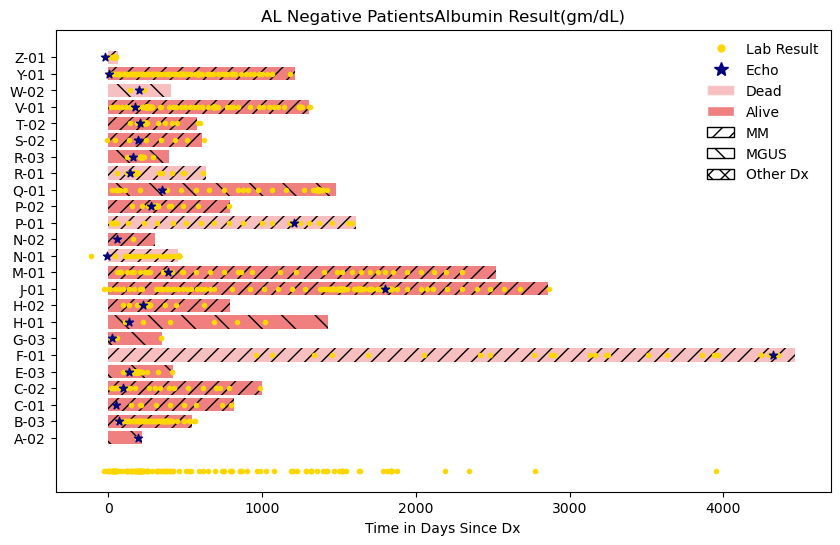

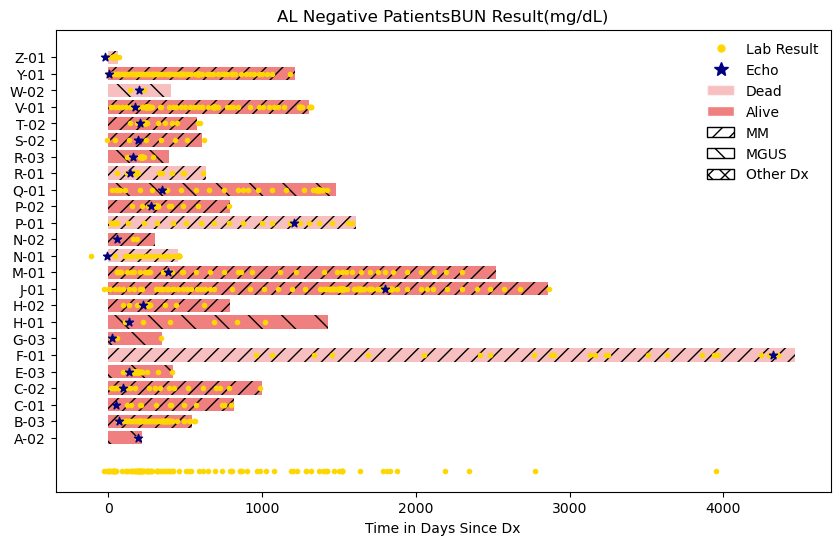

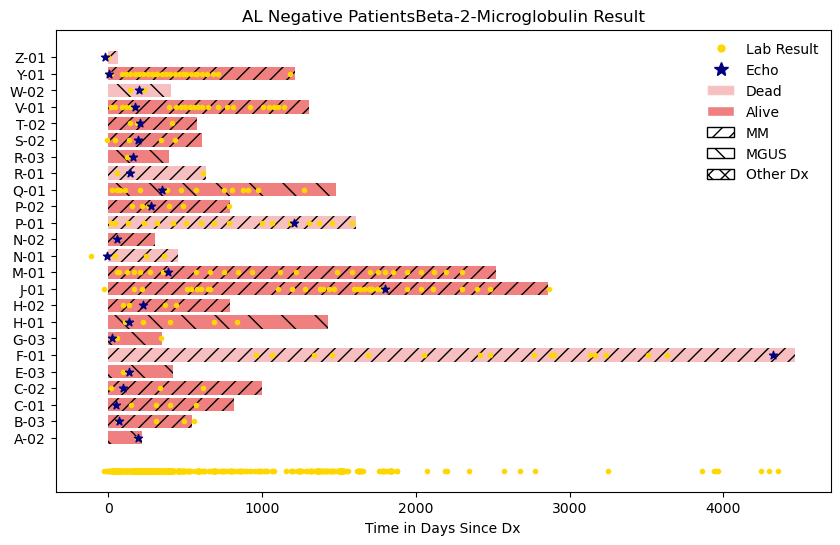

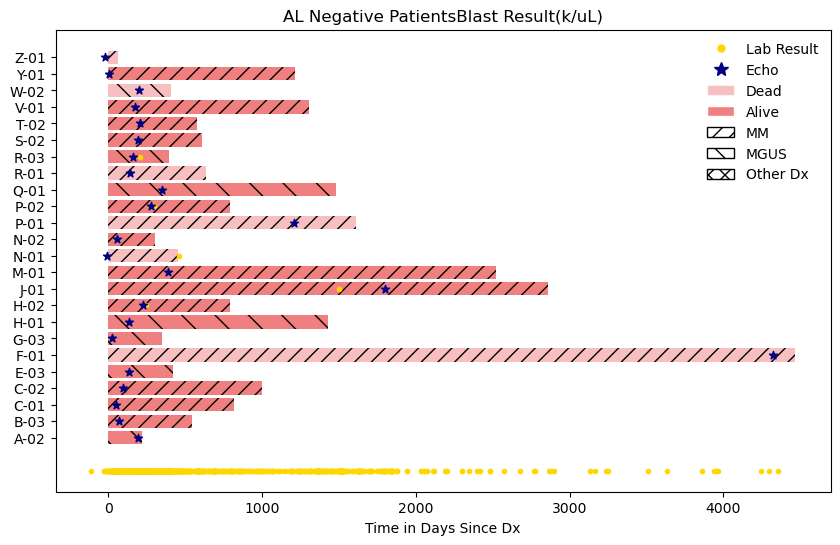

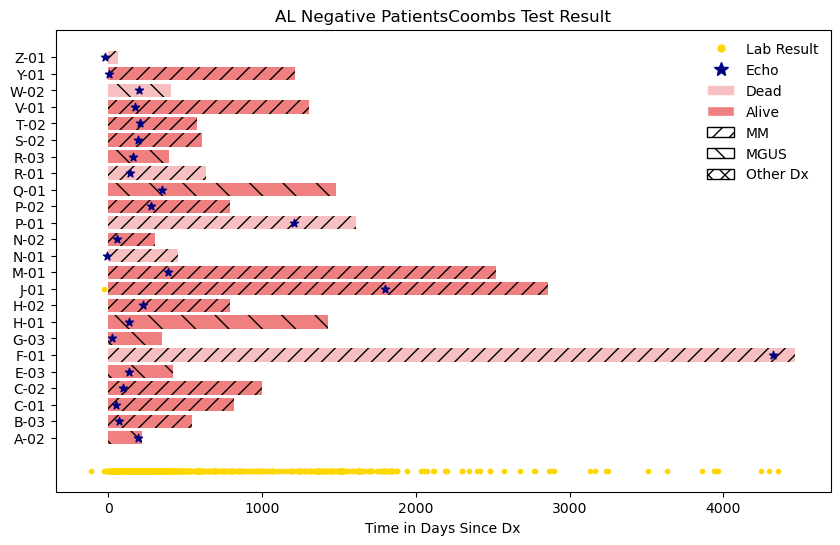

...

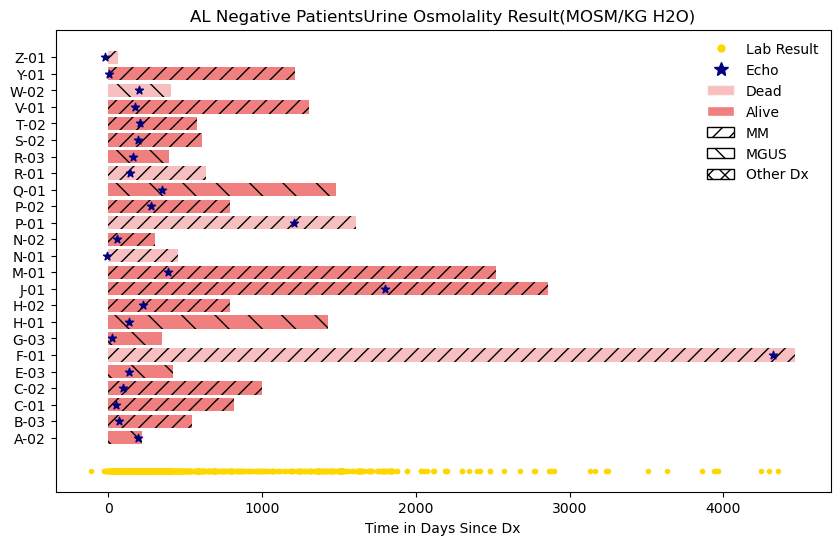

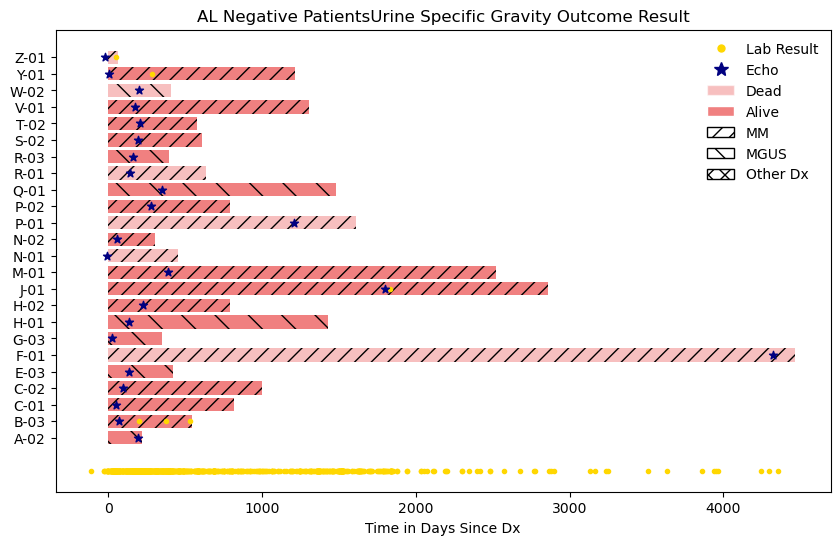

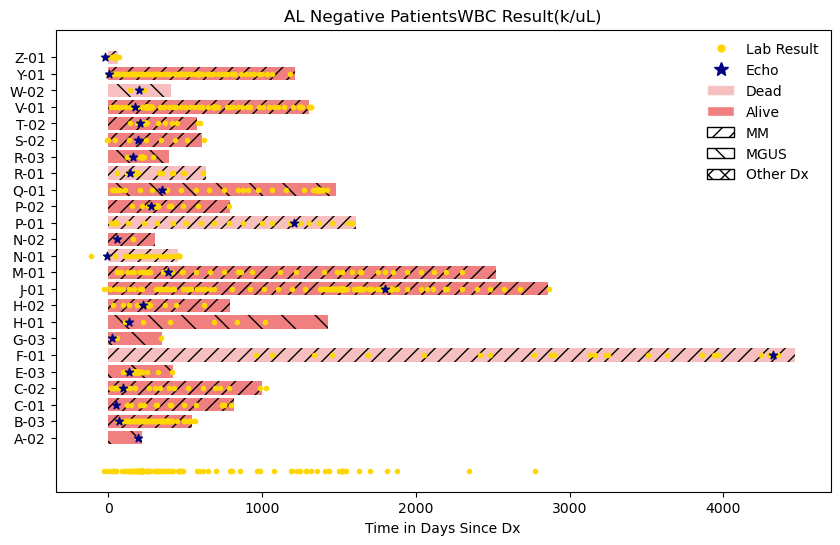

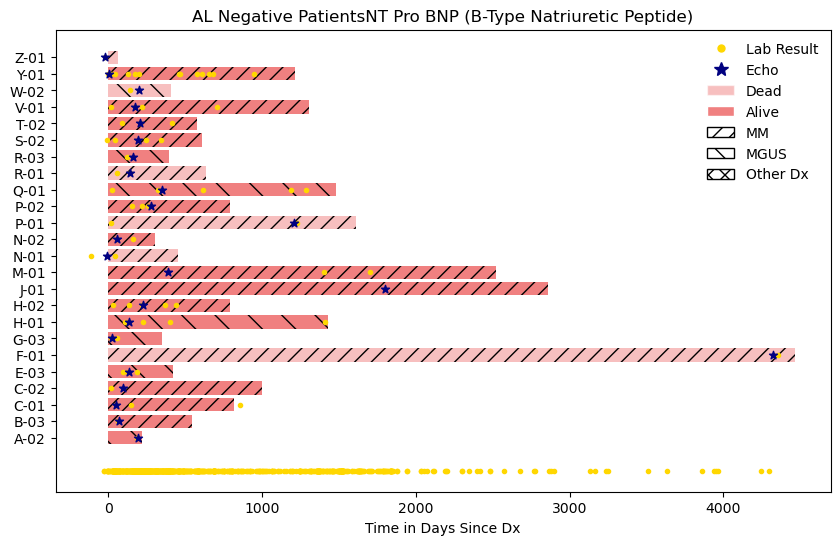

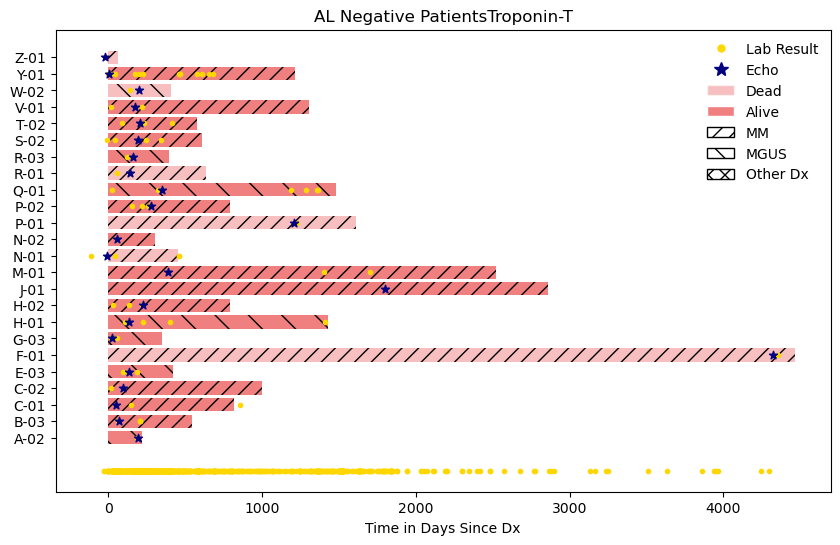

In [46]:
#same as above but for amyloid negative patients
timeColumn = 'RelTime(Days)'
EchoTimeColumn ='time from diagnosis to first echo (months)'
ptList = listNegative #list of patients you want to plot

#output file information
outfileStart = "AL-Negative"
outfileEnding = "-swimmer"
figureTitleCommon = "AL Negative Patients"
xLabel = "Time in Days Since Dx"
#path = path to folder where you want the information saved

#figure information
figuresize = (10,6)
barcolor = 'lightcoral'
labcolor = 'gold'
echoColor = 'navy'
labmarker = '.'
echomarker = '*'
step_size = 0.5 
heightbars = 0.4
alpha_Dead = 0.5
alpha_Alive = 1
hatch_MM = '//'
hatch_MGUS = '\\'
hatch_other = 'xx'

#some other definitions to help with reading this code
# echoDates = echoDates #dictionary of patient IDs and echo dates retreived from patient data
# dictOfFilteredLabs = dictionary of patient labs filtered for columns of interest.
# dictOfNormalRanges = dictionary of normal ranges for patient labs by time in days
# dictOfBinaryLabs = dictionary of patient labs by ID of patient labs as binary over time
# patientDictSurvival = dictionary of patient IDs and survival in months 

for labofinterest in columnNames:
    #collecting patient IDs for y axis 
    y_pt_ids = {}
    i=1

    fig, ax = plt.subplots(figsize=figuresize)
    increment = i
    for pt_ID in ptList: 
        #collecting the patient IDs to make a label for the y axis
        y_pt_ids.update({pt_ID : increment})
        ySpot = y_pt_ids[pt_ID]
        xSpot = float(patientDictSurvival[pt_ID])*30.4 #correct from months to days

        #check patient dx and vital status to code the shading effects
        if patientDictVitalStatus[pt_ID] == "Dead":
            alpha = alpha_Dead
        else:
            alpha = alpha_Alive

        if "MGUS" in patientDictDx[pt_ID]:
            h = hatch_MGUS
        elif "multiple myeloma" or "MM" in patientDictDx[pt_ID]:
            h = hatch_MM
        else: 
            h = hatch_other
            
        ax.barh(ySpot, xSpot, align = 'center', color = barcolor, height =heightbars,
                hatch = h, alpha = alpha)

        #copying the lab data for scatter
        binary_df = dictOfBinaryLabs[pt_ID]
        df_labs = dictOfFilteredLabs[pt_ID]

        #makes a copy of the dataframe that can be incremented before plotting
        df_logic_increment = binary_df #for increment
        df_for_plot = binary_df #for plot
        df_for_size = binary_df
        #incrementing the data
        df_logic_increment[labofinterest] = df_for_plot[labofinterest].replace(1, increment)
        
        #plotting lab data binary
        xscatter = df_for_plot[timeColumn]
        yscatter = df_for_plot[labofinterest]
        if len(xscatter) == len(yscatter):
            plt.scatter(x= xscatter, y= yscatter, c= labcolor, marker=labmarker)
        else:
            print("patient ", pt ," no scatter plot for lab ", labofinterest)

        #adding the date of echo
        if pt_ID in list(echoDates.keys()):
            #the echoDates have been cleaned to remove non-numerical data
            patientEchoDate = echoDates[pt_ID]
            echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
            plt.scatter(x = echoDate_toplot, y = y_pt_ids[pt_ID], c =echoColor, marker=echomarker)
        
        #increment before next patient
        increment = increment + step_size


    #converting the y-axis to show the patient IDs
    current_yticks =  list(y_pt_ids.values())
    new_ytick_labels = list(y_pt_ids.keys())
    ax.set_yticks(current_yticks, new_ytick_labels)
    ax.set_title(figureTitleCommon + labofinterest)
    ax.set_xlabel(xLabel)

    #adding legend 
    # Create dummy patches and lines for the legend
    # Create dummy patches and lines for the legend
    labmarker_line = plt.Line2D([0], [0], linestyle='none', marker=labmarker, color=labcolor, markersize=10, label=f'Lab Result')
    echomarker_line = plt.Line2D([0], [0], linestyle='none', marker=echomarker, color=echoColor, markersize=10, label=f'Echo')

    alpha_Dead_patch = mpatches.Patch(facecolor= barcolor, alpha=alpha_Dead, edgecolor='white', label=f'Dead')
    alpha_Alive_patch = mpatches.Patch(facecolor= barcolor, alpha=alpha_Alive, edgecolor='white', label=f'Alive')

    hatch_MM_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_MM, label=f'MM')
    hatch_MGUS_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_MGUS, label=f'MGUS')
    hatch_other_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_other, label=f'Other Dx')

    # Add all patches and lines to the legend
    handles = [labmarker_line, echomarker_line, alpha_Dead_patch, alpha_Alive_patch, hatch_MM_patch, hatch_MGUS_patch, hatch_other_patch]
    ax.legend(handles=handles, loc='upper right', frameon=False)



    #saving the image
    labdescriptor = labofinterest.strip(",.!@#$%^&*()")
    labdescriptor = labdescriptor.replace("/", "-")
    out_filename = outfileStart + '-' + labdescriptor + outfileEnding + dateTag + '.tif'
    new_filepath = os.path.join(path,out_filename)
    plt.savefig(new_filepath, bbox_inches = 'tight')

swimmers for unknown patients

C:\Users\maega\AppData\Local\Temp\ipykernel_58764\1567556387.py:86: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\1567556387.py:86: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\1567556387.py:86: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
C:\Users\maega\AppData\Local\Temp\ipykernel_58764\1567556387.py:86: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in t

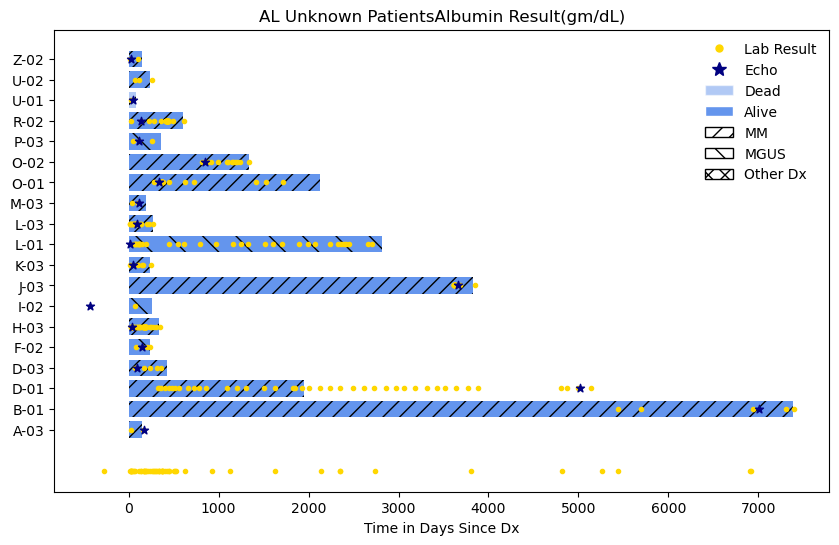

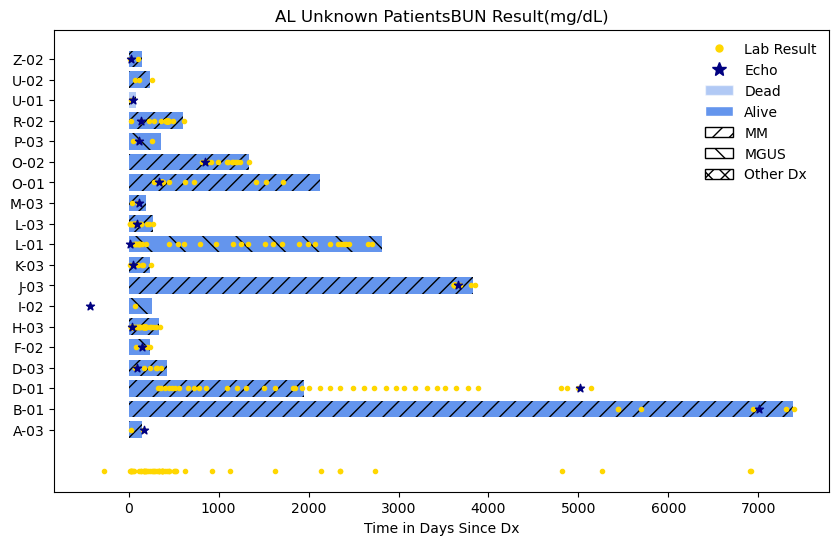

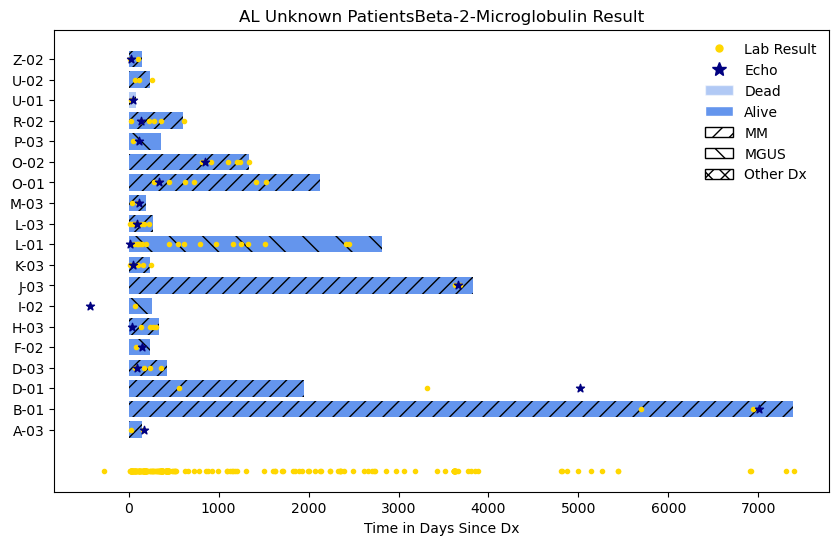

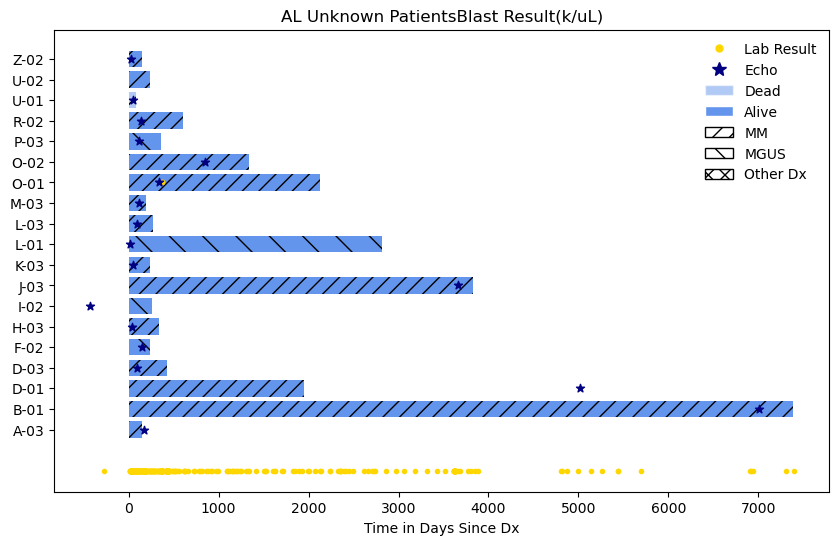

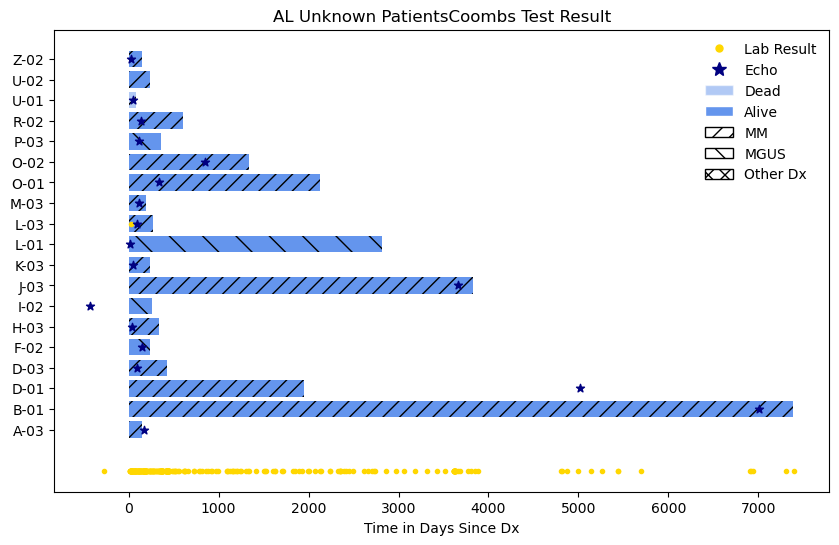

...

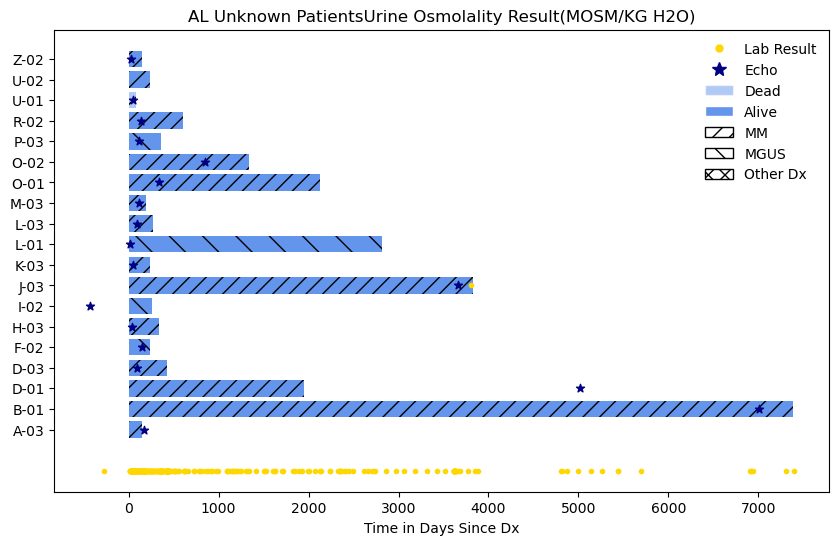

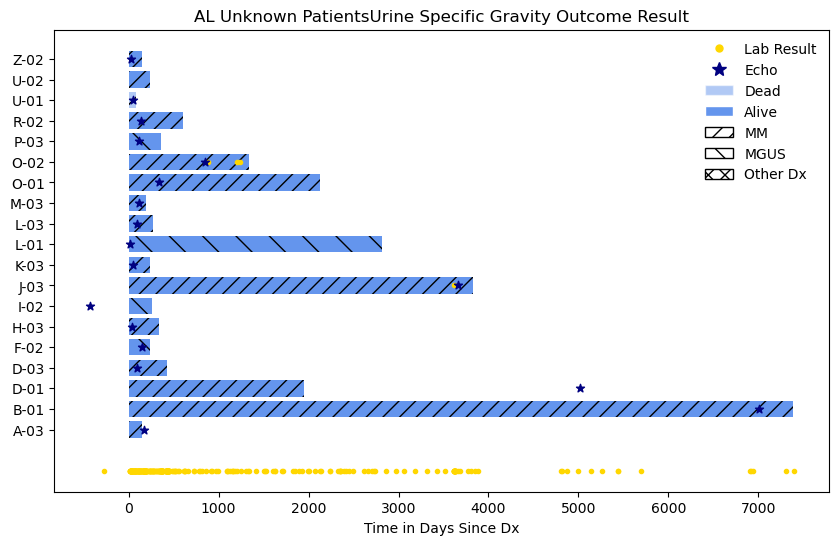

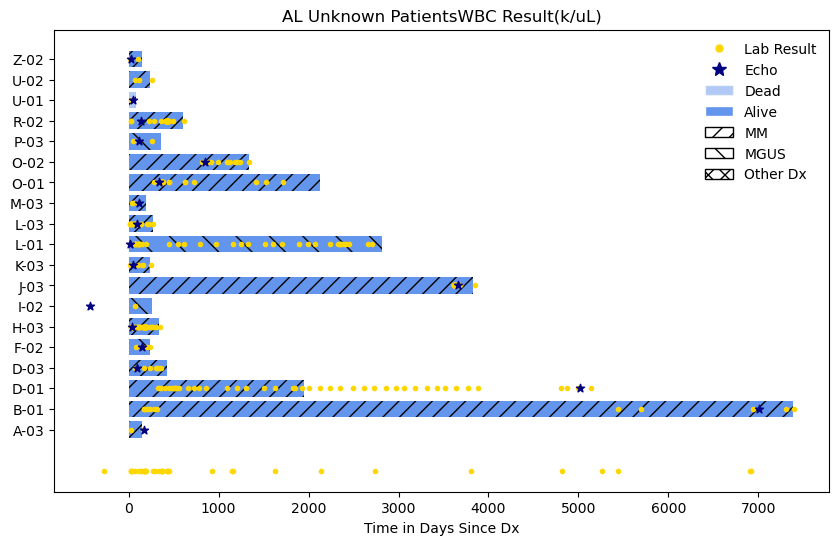

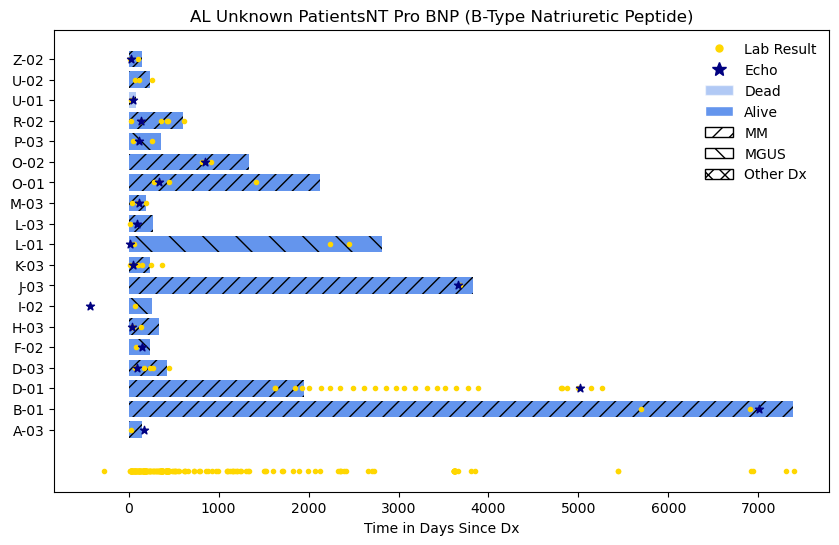

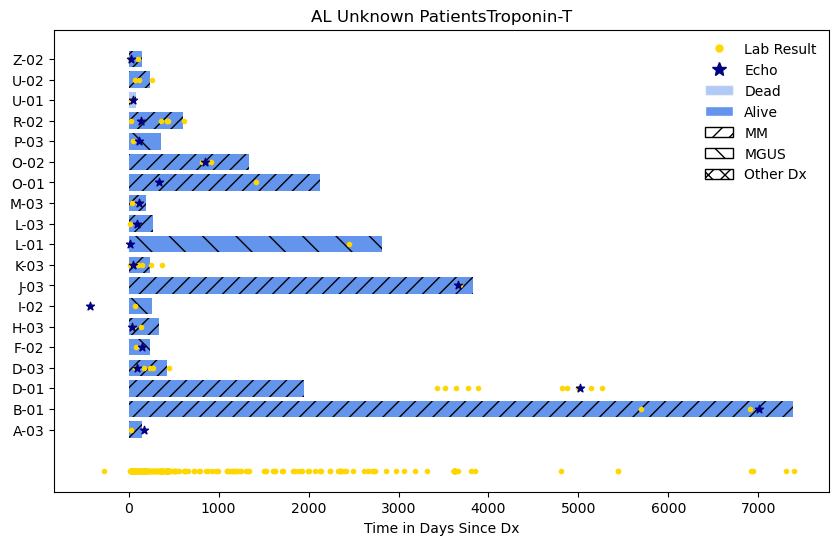

In [45]:
timeColumn = 'RelTime(Days)'
EchoTimeColumn ='time from diagnosis to first echo (months)'
ptList = listOther #list of patients you want to plot

#output file information
outfileStart = "AL-Unknown"
outfileEnding = "-swimmer"
figureTitleCommon = "AL Unknown Patients"
xLabel = "Time in Days Since Dx"
#path = path to folder where you want the information saved

#figure information
figuresize = (10,6)
barcolor = 'cornflowerblue'
labcolor = 'gold'
echoColor = 'navy'
labmarker = '.'
echomarker = '*'
step_size = 0.5 
heightbars = 0.4
alpha_Dead = 0.5
alpha_Alive = 1
hatch_MM = '//'
hatch_MGUS = '\\'
hatch_other = 'xx'

#some other definitions to help with reading this code
# echoDates = echoDates #dictionary of patient IDs and echo dates retreived from patient data
# dictOfFilteredLabs = dictionary of patient labs filtered for columns of interest.
# dictOfNormalRanges = dictionary of normal ranges for patient labs by time in days
# dictOfBinaryLabs = dictionary of patient labs by ID of patient labs as binary over time
# patientDictSurvival = dictionary of patient IDs and survival in months 

for labofinterest in columnNames:
    #collecting patient IDs for y axis 
    y_pt_ids = {}
    i=1

    fig, ax = plt.subplots(figsize=figuresize)
    increment = i
    for pt_ID in ptList: 
        #collecting the patient IDs to make a label for the y axis
        y_pt_ids.update({pt_ID : increment})
        ySpot = y_pt_ids[pt_ID]
        xSpot = float(patientDictSurvival[pt_ID])*30.4 #correct from months to days

        #check patient dx and vital status to code the shading effects
        if patientDictVitalStatus[pt_ID] == "Dead":
            alpha = alpha_Dead
        else:
            alpha = alpha_Alive

        if "MGUS" in patientDictDx[pt_ID]:
            h = hatch_MGUS
        elif "multiple myeloma" or "MM" in patientDictDx[pt_ID]:
            h = hatch_MM
        else: 
            h = hatch_other
            
        ax.barh(ySpot, xSpot, align = 'center', color = barcolor, height =heightbars,
                hatch = h, alpha = alpha)

        #copying the lab data for scatter
        binary_df = dictOfBinaryLabs[pt_ID]
        df_labs = dictOfFilteredLabs[pt_ID]

        #makes a copy of the dataframe that can be incremented before plotting
        df_logic_increment = binary_df #for increment
        df_for_plot = binary_df #for plot
        df_for_size = binary_df
        #incrementing the data
        df_logic_increment[labofinterest] = df_for_plot[labofinterest].replace(1, increment)
        
        #plotting lab data binary
        xscatter = df_for_plot[timeColumn]
        yscatter = df_for_plot[labofinterest]
        if len(xscatter) == len(yscatter):
            plt.scatter(x= xscatter, y= yscatter, c= labcolor, marker=labmarker)
        else:
            print("patient ", pt ," no scatter plot for lab ", labofinterest)

        #adding the date of echo
        if pt_ID in list(echoDates.keys()):
            #the echoDates have been cleaned to remove non-numerical data
            patientEchoDate = echoDates[pt_ID]
            echoDate_toplot = float(patientEchoDate) *30.4 #convert to days
            plt.scatter(x = echoDate_toplot, y = y_pt_ids[pt_ID], c =echoColor, marker=echomarker)
        
        #increment before next patient
        increment = increment + step_size


    #converting the y-axis to show the patient IDs
    current_yticks =  list(y_pt_ids.values())
    new_ytick_labels = list(y_pt_ids.keys())
    ax.set_yticks(current_yticks, new_ytick_labels)
    ax.set_title(figureTitleCommon + labofinterest)
    ax.set_xlabel(xLabel)

    #adding legend 
    # Create dummy patches and lines for the legend
    # Create dummy patches and lines for the legend
    labmarker_line = plt.Line2D([0], [0], linestyle='none', marker=labmarker, color=labcolor, markersize=10, label=f'Lab Result')
    echomarker_line = plt.Line2D([0], [0], linestyle='none', marker=echomarker, color=echoColor, markersize=10, label=f'Echo')

    alpha_Dead_patch = mpatches.Patch(facecolor= barcolor, alpha=alpha_Dead, edgecolor='white', label=f'Dead')
    alpha_Alive_patch = mpatches.Patch(facecolor= barcolor, alpha=alpha_Alive, edgecolor='white', label=f'Alive')

    hatch_MM_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_MM, label=f'MM')
    hatch_MGUS_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_MGUS, label=f'MGUS')
    hatch_other_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_other, label=f'Other Dx')

    # Add all patches and lines to the legend
    handles = [labmarker_line, echomarker_line, alpha_Dead_patch, alpha_Alive_patch, hatch_MM_patch, hatch_MGUS_patch, hatch_other_patch]
    ax.legend(handles=handles, loc='upper right', frameon=False)



    #saving the image
    labdescriptor = labofinterest.strip(",.!@#$%^&*()")
    labdescriptor = labdescriptor.replace("/", "-")
    out_filename = outfileStart + '-' + labdescriptor + outfileEnding + dateTag + '.tif'
    new_filepath = os.path.join(path,out_filename)
    plt.savefig(new_filepath, bbox_inches = 'tight')

OLD CODE HERE

For creating dictionary of the binary lab information.  a patient either does or doesn't have a lab result on a given day. 
do the same thing for the other types of data

In [31]:
#building a dictionary function 
def dict_of_df(list_of_files, startfile_common, startfile_ending, sheet_name_in, new_dict_name): 
    for file in list_of_files:
        if startfile_common in file and file.endswith('.xlsx'):
            df_ptLabs_binary = pd.read_excel(file, sheet_name = sheet_name_in) #to load a datafame with the patient lab values
            # Get the patient ID to use as key
            notptID = len(startfile_common) + len(startfile_ending) +1 #section of file name that isn't ptID
            fname_start = file[:-notptID] #this removes the extension from the raw file name for construction of the outfile
            file_key = fname_start

            # Store the dataframe in the dictionary
            new_dict_name[file_key] = df_ptLabs_binary

#list of dictionaries holding the dataframes
dict_test= {}
dataframes_binary = {}
dataframes_bin_sum = {}
dataframes_ordersets_bin = {}

#populating the dataframes
dict_of_df(file_names_list, startfile_common, startfile_ending, labs_binary_sum_sheet, dataframes_bin_sum)
dict_of_df(file_names_list, startfile_common, startfile_ending, labs_binary_sheet, dataframes_binary)
dict_of_df(file_names_list, startfile_common, startfile_ending, ordersets_bin_sheet, dataframes_ordersets_bin)

In [32]:
#for plotting data for a particular patient

#patient identifying information 
pt_columns = ["DeID", "RelTime", "Survival"]

#creating a dictionary for the order sets
ordersets_dict = {
    "A" : ["BUN", "Creatinine"], #liver function and nitrogen 
    "B" : ["Hemoglobin", "HemoglobinLowerLim", "Platelet"], #basic heme labs
    "C" : ["KappaFLC", "LambdaFLC", "FLCratio"], #special labs for light chains
    "D" : ["TotalUrineProtein", "UrineAlbumin"],
    "E" : ["NTproBNP", "TroponinT"], #cardio labs often ordered together
    "B2M" : ["B2M"], 
    "LDH" : ["LDH"], 
    "UricAcid": ["UricAcid"]
}

#dictionary for the markers
markers = {
    "A" : "s", #square 
    "B" : "p", #plus 
    "C" : "*", #star
    "D" : "X", #x
    "E" : "^", #triangle up
    "B2M" : "o", #circle
    "LDH" : "o", #circle
    "UricAcid": "o" #circle
}

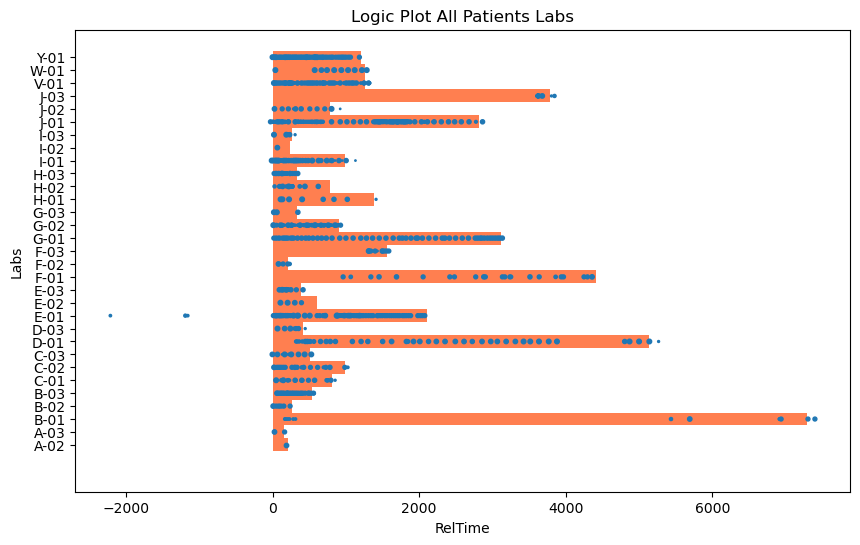

In [35]:
#plot data from a patient
# pt_ID = dataframes_binary.keys() #calling a particular patient?

fig, ax = plt.subplots(figsize=(10,6))
ax.set(title = "Logic Plot All Patients Labs")

pt_survival = {}

for pt_ID in dataframes_binary.keys(): 
    df = dataframes_binary[pt_ID]
    survival_numb = df.at[0, "Survival"]
    pt_survival.update({pt_ID: survival_numb})

#collecting patient IDs for y axis 
y_pt_ids = {}
step_size = 0.5 
increment = 1
for pt_ID in dataframes_binary.keys(): 
     #collecting the patient IDs to make a label for the y axis
    y_pt_ids.update({pt_ID : increment})
    #increment before next patient
    increment = increment + step_size
    
# fig, ax = plt.subplots()
y_test = list(y_pt_ids.values()) #uses the y values collected earlier, otherwise uncommment the above 
x_test = list(pt_survival.values())

#plotting
ax.barh(y_test, x_test, align= 'center',  color = "coral", height = 0.5 )
# plt.show()

y_pt_ids = {}
step_size = 0.5 
increment = 1
for pt_ID in dataframes_binary.keys(): 
    df = dataframes_binary[pt_ID]
    #makes a copy of the dataframe that can be incremented before plotting
    df_logic_increment = df #for increment
    df_for_plot = df #for plot
    df_for_size = df
    #incrementing the data
    df_logic_increment["Labs"] = df_for_plot["Labs"].replace(1, increment)
    
    #collecting the patient IDs to make a label for the y axis
    y_pt_ids.update({pt_ID : increment})
    
    #collecting the total number of labs collected as the size of the data point 
    df_for_size = dataframes_bin_sum[pt_ID]
    point_sizes = df_for_size["Labs"]
    #plotting
    ax = df_for_plot.plot.scatter(x="RelTime", y = "Labs", s= point_sizes, ax=ax)
    #increment before next patient
    increment = increment + step_size

#converting the y-axis to show the patient IDs
current_yticks =  list(y_pt_ids.values())
new_ytick_labels = list(y_pt_ids.keys())
ax.set_yticks(current_yticks, new_ytick_labels)

#not sure how to create the legend just yet


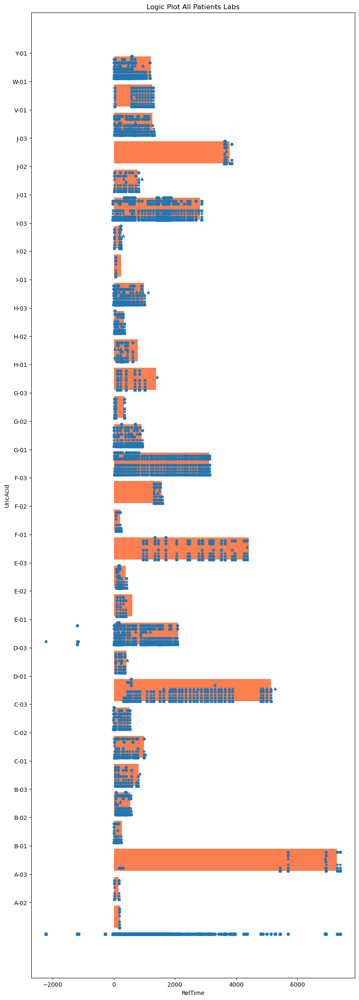

In [36]:
#plot data from a patient
# pt_ID = dataframes_binary.keys() #calling a particular patient?

fig, ax = plt.subplots(figsize=(10,30))
ax.set(title = "Logic Plot All Patients Labs")

pt_survival = {}

for pt_ID in dataframes_ordersets_bin.keys(): 
    df = dataframes_ordersets_bin[pt_ID]
    survival_numb = df.at[0, "Survival"]
    pt_survival.update({pt_ID: survival_numb})

#collecting patient IDs for y axis 
y_pt_ids = {}
step_size = 0.5 * (len(ordersets_dict)+1)
increment = 1
for pt_ID in dataframes_ordersets_bin.keys(): 
     #collecting the patient IDs to make a label for the y axis
    y_pt_ids.update({pt_ID : increment})
    #increment before next patient
    increment = increment + step_size
    
#creating list of the sub numbers for the lab value stacking 


# fig, ax = plt.subplots()
y_test = list(y_pt_ids.values()) #uses the y values collected earlier, otherwise uncommment the above 
x_test = list(pt_survival.values())

#plotting
ax.barh(y_test, x_test, color = "coral", align= 'edge' , height= 3.5 )
# plt.show()

y_pt_ids = {}
step_size = 0.5 
increment = 1


for pt_ID in dataframes_ordersets_bin.keys(): 
    df = dataframes_ordersets_bin[pt_ID]
    #makes a copy of the dataframe that can be incremented before plotting
    df_logic_increment = df #for increment
    df_for_plot = df #for plot
    df_for_size = df
    #incrementing the data
    # df_logic_increment["Labs"] = df_for_plot["Labs"].replace(1, increment)
    
    for orderset_name in ordersets_dict.keys():
        df_logic_increment[orderset_name] = df_for_plot[orderset_name].replace(1, increment)
        increment = increment + step_size #this is such that each order set will have a different rank
    
    #ploting the ordersets
    for orderset_name in ordersets_dict.keys(): 
        ax = df_for_plot.plot.scatter(x="RelTime", y = orderset_name, marker=markers[orderset_name], ax=ax)
    
    #collecting the patient IDs to make a label for the y axis
    y_pt_ids.update({pt_ID : increment})
    
    # #collecting the total number of labs collected as the size of the data point 
    # df_for_size = dataframes_bin_sum[pt_ID]
    # point_sizes = df_for_size["Labs"]
    #plotting
    # ax = df_for_plot.plot.scatter(x="RelTime", y = "Labs", s= point_sizes, ax=ax)
    #increment before next patient
    increment = increment + step_size

#converting the y-axis to show the patient IDs
current_yticks =  list(y_pt_ids.values())
new_ytick_labels = list(y_pt_ids.keys())
ax.set_yticks(current_yticks, new_ytick_labels)

#not sure how to create the legend just yet


In [ ]:
#make a way to sort patients by survival... 
#call the survival data for all patients into a dictionary using their patient ID


#sort the data by survival

#then call the data for the patients in the order generated above.

collection of functions to graph different elements